# Decision Trees 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
import functions as fn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score, roc_curve, auc, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.preprocessing import StandardScaler, LabelBinarizer
from sklearn.externals.six import StringIO 
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import tree
from IPython.display import Image

/Users/jjherranzsarrion/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


## Running the data preparation notebook in order to generate the necessary pickles

In [2]:
#Run the data_prep notebook to generate the train and test pickles

% run ./data_prep.ipynb

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
Make                 11914 non-null object
Model                11914 non-null object
Year                 11914 non-null int64
Engine Fuel Type     11911 non-null object
Engine HP            11845 non-null float64
Engine Cylinders     11884 non-null float64
Transmission Type    11914 non-null object
Driven_Wheels        11914 non-null object
Number of Doors      11908 non-null float64
Market Category      8172 non-null object
Vehicle Size         11914 non-null object
Vehicle Style        11914 non-null object
highway MPG          11914 non-null int64
city mpg             11914 non-null int64
Popularity           11914 non-null int64
MSRP                 11914 non-null int64
dtypes: float64(3), int64(5), object(8)
memory usage: 1.5+ MB


./data_prep.ipynb:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  {
./data_prep.ipynb:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  {
/Users/jjherranzsarrion/anaconda3/envs/learn-env/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


<class 'pandas.core.frame.DataFrame'>
Int64Index: 7856 entries, 0 to 11912
Data columns (total 16 columns):
Make                 7856 non-null object
Model                7856 non-null object
Year                 7856 non-null int64
Engine Fuel Type     7856 non-null object
Engine HP            7856 non-null float64
Engine Cylinders     7856 non-null float64
Transmission Type    7856 non-null object
Driven_Wheels        7856 non-null object
Number of Doors      7856 non-null float64
Market Category      6219 non-null object
Vehicle Size         7856 non-null object
Vehicle Style        7856 non-null object
highway MPG          7856 non-null int64
city mpg             7856 non-null int64
Popularity           7856 non-null int64
MSRP                 7856 non-null int64
dtypes: float64(3), int64(5), object(8)
memory usage: 1.0+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 6219 entries, 0 to 11912
Data columns (total 16 columns):
Make                 6219 non-null object
Model     

./data_prep.ipynb:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  {
./data_prep.ipynb:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  {
/Users/jjherranzsarrion/anaconda3/envs/learn-env/lib/python3.6/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5966 entries, 0 to 11912
Data columns (total 23 columns):
Year                 5966 non-null int64
Engine Fuel Type     5966 non-null object
Engine HP            5966 non-null float64
Engine Cylinders     5966 non-null float64
Transmission Type    5966 non-null object
Driven_Wheels        5966 non-null object
Vehicle Size         5966 non-null object
Vehicle Style        5966 non-null object
highway MPG          5966 non-null int64
city mpg             5966 non-null int64
Popularity           5966 non-null int64
MSRP                 5966 non-null int64
Origin               5966 non-null object
Factory Tuner        5966 non-null int64
Hybrid               5966 non-null int64
Exotic               5966 non-null int64
Flex Fuel            5966 non-null int64
Luxury               5966 non-null int64
Crossover            5966 non-null int64
Performance          5966 non-null int64
Hatchback            5966 non-null int64
Diesel               

In [3]:
#Open the train and test pickels generated by the data_prep file

with open('X_train.pickle', 'rb') as f:
    X_train = pickle.load(f)

with open('X_test.pickle', 'rb') as f:
    X_test = pickle.load(f)

with open('y_train.pickle', 'rb') as f:
    y_train = pickle.load(f)
    
with open('y_test.pickle', 'rb') as f:
    y_test = pickle.load(f)

### Instantiating our first Decision Tree and retrieving its corresponding confusion matrics

In [4]:
#Plot a baseline decision tree using the entropy encoding

dt, y_preds, criterion = fn.decision_tree(X_train, X_test, y_train, y_test, 'entropy', None)


Confusion Matrix
----------------
Predicted   0    1   2   3   4    5    6   All
True                                          
0          72    0   0   0   0    0    0    72
1           0  478   0   0   0    0    0   478
2           0    0  64   0   0    0    0    64
3           0    0   0  37   0    0    0    37
4           0    0   0   0  64    0    0    64
5           0    0   0   0   0  460    0   460
6           0    0   0   0   0    0  317   317
All        72  478  64  37  64  460  317  1492


From this confusion matrix we can see that all the values are True Positives given that they all lie along the main diagonal. Strange result which we will investigate further.

#### Calculating the evaluation metrics for our decision tree precision

In [5]:
print(f"Assesing the accuracy of our scores using the {criterion} impurity criterion. \n")
acc = accuracy_score(y_test, y_preds) * 100
print(f"Accuracy: {acc}")
prc = precision_score(y_test, y_preds, average='weighted') * 100
print(f"Precision: {round(prc, 2)}")
rcl = recall_score(y_test, y_preds, average='weighted') * 100
print(f"Recall: {round(rcl, 2)}")

Assesing the accuracy of our scores using the entropy impurity criterion. 

Accuracy: 100.0
Precision: 100.0
Recall: 100.0


As expected from the confusion matrix, 100% accuracy is achieved.

#### Retrieving the features importance from our Decision Tree and an image of the tree and all of its own branches

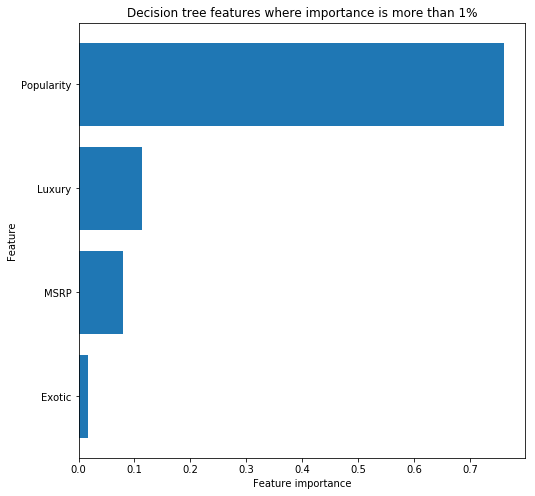

In [6]:
fn.plot_feature_importances(X_train, dt)

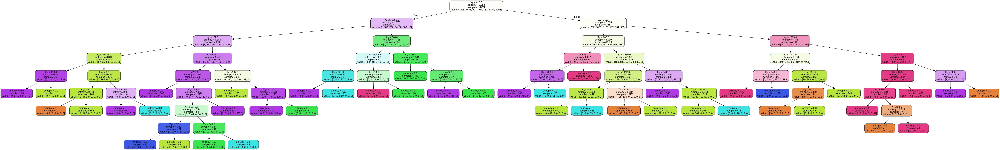

In [7]:
fn.tree_image(dt)

Popularity feature has a very high feature importance. Feature importance ranks the numerical features to be the most important features, therefore there are some limitations:
- Feature importances are computed on training set statistics and therefore do not reflect the ability of feature to be useful to make predictions that generalize to the test set

#### We decide to drop the popularity feature and proceed with further trees.

In [8]:
X_train.drop(['Popularity'], axis=1, inplace=True)

In [9]:
X_test.drop(['Popularity'], axis=1, inplace=True)

#### Reruning the notebook without the popularity feature to observe changes in the evaluation metrics

In [10]:
dt, y_preds, criterion = fn.decision_tree(X_train, X_test, y_train, y_test, 'entropy', None)


Confusion Matrix
----------------
Predicted   0    1   2   3   4    5    6   All
True                                          
0          63    4   0   2   0    3    0    72
1           1  472   0   0   0    4    1   478
2           0    0  61   1   2    0    0    64
3           0    0   0  34   0    1    2    37
4           0    0   0   0  61    3    0    64
5           2    5   0   2   2  443    6   460
6           0    1   1   1   0    6  308   317
All        66  482  62  40  65  460  317  1492


We can start observing some flase positives and false negatives appear. Interesting to observe that the countries which is confusing the most (based on ratio) is 4 with 5. 

In [11]:
print(f"Assesing the accuracy of our scores using the {criterion} impurity criterion. \n")
acc = accuracy_score(y_test, y_preds) * 100
print(f"Accuracy: {acc}")
prc = precision_score(y_test, y_preds, average='weighted') * 100
print(f"Precision: {round(prc, 2)}")
rcl = recall_score(y_test, y_preds, average='weighted') * 100
print(f"Recall: {round(rcl, 2)}")

Assesing the accuracy of our scores using the entropy impurity criterion. 

Accuracy: 96.64879356568365
Precision: 96.67
Recall: 96.65


As expected from the confusion matrix, 100% is no longer achieved. However, our result is still high (96%)

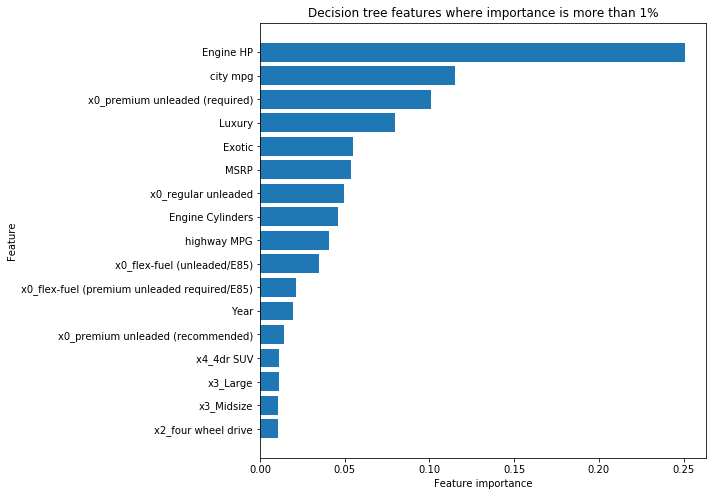

In [12]:
fn.plot_feature_importances(X_train, dt)

In [13]:
fn.tree_image(dt)

Even though data leakage seems to have decreased substantially, the model now has a significant amount of depth, which can be a signal for overfitting. Therefore, we will focus on hypterparameter tuning to reduce this possibility. 

### Hyper parameter tunning

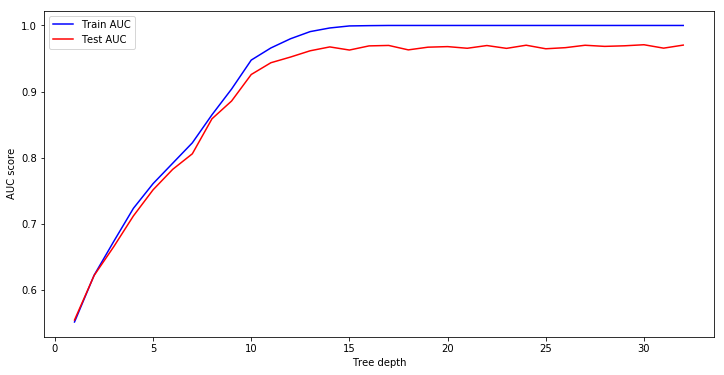

In [14]:
# Identifying the optimal tree depth for the given data
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
    dt = DecisionTreeClassifier(criterion='entropy', max_depth=max_depth)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    roc_auc_score_train_output = fn.multiclass_roc_auc_score(y_train, train_pred, average="macro")
    # Add auc score to previous train results
    train_results.append(roc_auc_score_train_output)
    y_preds = dt.predict(X_test)
    roc_auc_score_test_output = fn.multiclass_roc_auc_score(y_test, y_preds, average="macro")
    # Add auc score to previous test results
    test_results.append(roc_auc_score_test_output)
plt.figure(figsize=(12,6))
plt.plot(max_depths, train_results, 'b', label='Train AUC')
plt.plot(max_depths, test_results, 'r', label='Test AUC')
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.legend()
plt.show()

The optimal tree depth is 14. Therefore, we will begin to set the max_depth variable to 14.

#### Update the decision tree function to include the max_depth parameter

In [17]:
fn.decision_tree(X_train, X_test, y_train, y_test, 'entropy', 14)


Confusion Matrix
----------------
Predicted   0    1   2   3   4    5    6   All
True                                          
0          63    4   0   2   0    3    0    72
1           1  472   0   0   0    4    1   478
2           0    0  62   0   2    0    0    64
3           0    0   0  35   0    0    2    37
4           0    0   0   0  61    3    0    64
5           2    6   0   0   1  444    7   460
6           0    0   2   1   0    8  306   317
All        66  482  64  38  64  462  316  1492


(DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=15,
                        max_features=None, max_leaf_nodes=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=1, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, presort=False,
                        random_state=10, splitter='best'),
 array([6, 1, 5, ..., 1, 1, 1]),
 'entropy')

In [18]:
print(f"Assesing the accuracy of our scores using the {criterion} impurity criterion. \n")
acc = accuracy_score(y_test, y_preds) * 100
print(f"Accuracy: {acc}")
prc = precision_score(y_test, y_preds, average='weighted') * 100
print(f"Precision: {round(prc, 2)}")
rcl = recall_score(y_test, y_preds, average='weighted') * 100
print(f"Recall: {round(rcl, 2)}")

Assesing the accuracy of our scores using the entropy impurity criterion. 

Accuracy: 96.51474530831099
Precision: 96.52
Recall: 96.51


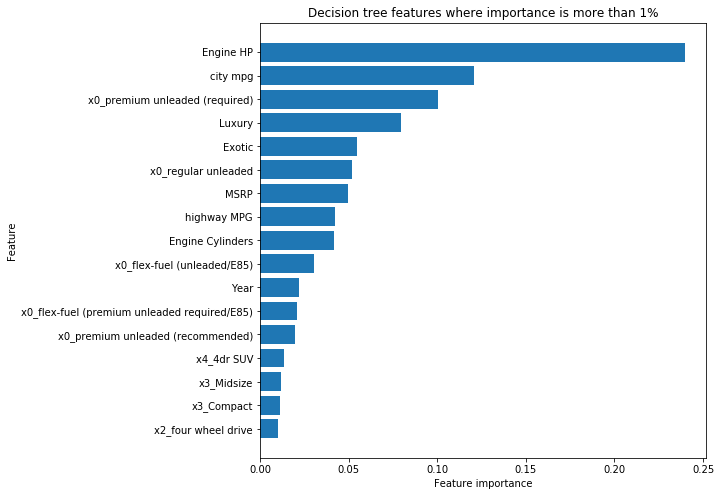

In [19]:
fn.plot_feature_importances(X_train, dt)

In [20]:
fn.tree_image(dt)

Given that the optimal depth is 15 branches, the tree is the same as before the hyper parameter tunning.

In [21]:
fn.get_metrics_by_class(y_test, y_preds, score_type='macro')

,Accuracy,F1_Score,Precision,Recall
0,0.861111,0.905109,0.953846,0.861111
1,0.985356,0.981250,0.977178,0.985356
2,0.953125,0.968254,0.983871,0.953125
3,0.945946,0.921053,0.897436,0.945946
4,0.953125,0.945736,0.938462,0.953125
5,0.963043,0.961998,0.960954,0.963043
6,0.968454,0.966929,0.965409,0.968454
M,0.965147,0.950047,0.953879,0.947166


### Decision trees with different criterion variables (ie gini, entropy) lead to different evaluation metrics.

This is because the criterion variables build the tree in different ways:
- Gini measurement is the probability of a random sample being classified incorrectly if we randomly pick a label according to the distribution in a branch.
- Entropy is a measurement of information (or rather lack thereof). You calculate the information gain by making a split.

### Running a decision tree using the gini coefficient

In [22]:
dt, y_preds, criterion = fn.decision_tree(X_train, X_test, y_train, y_test, 'gini', 15)


Confusion Matrix
----------------
Predicted   0    1   2   3   4    5    6   All
True                                          
0          64    6   0   0   0    2    0    72
1           2  458   0   0   0   11    7   478
2           0    0  62   2   0    0    0    64
3           0    0   0  37   0    0    0    37
4           0    2   0   0  62    0    0    64
5           1    6   3   0   2  441    7   460
6           0    2   2   2   0   11  300   317
All        67  474  67  41  64  465  314  1492


In [23]:
print(f"Assesing the accuracy of our scores using the {criterion} impurity criterion. \n")
acc = accuracy_score(y_test, y_preds) * 100
print(f"Accuracy: {acc}")
prc = precision_score(y_test, y_preds, average='weighted') * 100
print(f"Precision: {round(prc, 2)}")
rcl = recall_score(y_test, y_preds, average='weighted') * 100
print(f"Recall: {round(rcl, 2)}")

Assesing the accuracy of our scores using the gini impurity criterion. 

Accuracy: 95.44235924932975
Precision: 95.47
Recall: 95.44


Accuracy is not as high as when the model's encoder is entropy.

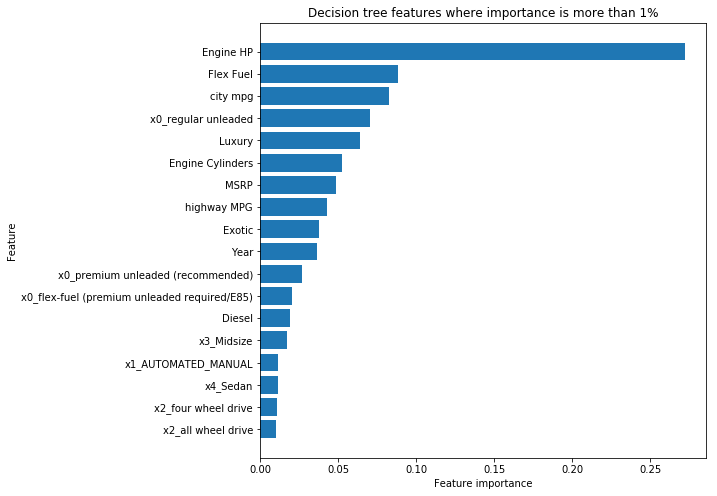

In [24]:
fn.plot_feature_importances(X_train, dt)

It is interesting to see that the certain feature's importance differ in the gini trees (Engine HP is higher).

## The tree with the highest accuracy is the one that uses the entropy encoder and has a maximum depth of 15

## Summary

- Decision tree can predict carmaker origin on test date with 96% accuracy and 0.95 F1-score
- The optimal number of branches the tree should have is 14
- Train, test split should not be random to model performance

## Comments

It is imperative to say that the model has been subject to data leakage. If we generalise, car models tend to have almost identical features regardless of the year of production, making our accuracy very high. For example, Engine HP are discrete values and sometimes they are very specific (ie 518 HP). If we were predicting the country of origin of a 518HP car, there is only one model that fits said criteria (Land Rover) therefore the model is going to predict that it is from the UK and it is going to be accurate. 

## Future steps

In order to reduce the data leakage, we can either:
- Make sure car models are different in the test and train data
- 